## CS4035 - Cyber Data Analytics (Lab 3)
### Group Number : 33
### Student 1 
#### Name : Shipra Sharma
#### ID : 5093406
### Student 2
#### Name : Sudharshan Swaminathan
#### ID : 5148340

### Readme (setup instructions)
We installed two explicit modules named `yellowbricks`, `tslearn` and `mmh3`. This could be done using `pip install` command in your python environment. Apart from these, all the functions and objects needed are included in the import statements. The other genral modules that are being imported are `sklearn`, `statsmodel`, `numpy`, `matplotlib`, and `pandas`. These should have already been installed on your system while doing the assignment (in case they are not, kindly install the same to execute the code smoothly).

**Note**: installation of mmh3 might throw error. Inorder to solve the same, please install Microsfot Visual Studio C++ build tools.

#### Import statements
Following inbuilt functions/objects have been used to implement the requiremets.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import statsmodels.tsa.api as smt
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.preprocessing import quantile_transform
from sklearn.preprocessing import LabelEncoder
import re
import random
from functools import reduce
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import statistics
from nltk import ngrams, trigrams
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from yellowbrick.cluster import KElbowVisualizer
import collections
import operator
from bitarray import bitarray
import mmh3
import math
from collections import Counter
import zipfile
from itertools import groupby
from scipy.spatial.distance import euclidean
from sklearn.metrics import jaccard_score
import time
import timeit
import math
from sklearn.metrics import confusion_matrix

D:\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


### Familiarization and discretization task

#### a. Plot visualizations - Select and visualize two features for modeling the behavior of the infected host.

In [58]:
#loading the data
archive = zipfile.ZipFile('dataset_lab3.zip', 'r')
original_data = pd.read_csv(archive.open('dataset_10/capture20110818.binetflow'))
labels = original_data.Label

We pick one of the infected hosts from the dataset by filtering them with the help of Labels. We then analyse which protocols do these hosts use the most to communicate. We pick one host `147.32.84.165` to visualize the botnet traffic.

In [3]:
# picking one infected host
infected_hosts_data = original_data.loc[original_data.Label.str.contains('Botnet', regex=True, na=False), :]
infected_hosts_data.head()

,StartTime,Dur,Proto,SrcAddr,Sport,Dir,DstAddr,Dport,State,sTos,dTos,TotPkts,TotBytes,SrcBytes,Label
90622,2011/08/18 10:37:58.448307,0.000342,udp,147.32.84.165,1025,<->,147.32.80.9,53,CON,0.0,0.0,2,203,64,flow=From-Botnet-V51-1-UDP-DNS
90808,2011/08/18 10:38:00.695278,0.010278,udp,147.32.84.165,1025,<->,147.32.80.9,53,CON,0.0,0.0,2,590,87,flow=From-Botnet-V51-1-UDP-DNS
90809,2011/08/18 10:38:00.706560,0.043726,tcp,147.32.84.165,1027,->,74.125.232.206,80,SRPA_SPA,0.0,0.0,7,882,629,flow=From-Botnet-V51-1-TCP-HTTP-Google-Net-Est...
90965,2011/08/18 10:38:03.255934,0.010256,udp,147.32.84.165,1025,<->,147.32.80.9,53,CON,0.0,0.0,2,479,76,flow=From-Botnet-V51-1-UDP-DNS
90968,2011/08/18 10:38:03.267222,581.516663,udp,147.32.84.165,123,->,65.55.56.40,123,INT,0.0,NaN,4,360,360,flow=From-Botnet-V51-1-UDP-Attempt


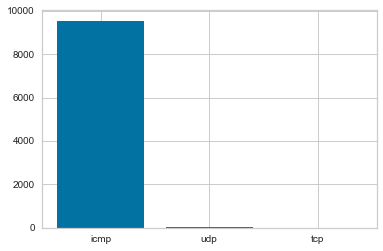

icmp    9537
udp       32
tcp       10
Name: Proto, dtype: int64


In [4]:
# filtering for botnet IP 147.32.84.165
infected_hosts_data = infected_hosts_data[(infected_hosts_data.SrcAddr == '147.32.84.165') | (infected_hosts_data.DstAddr == '147.32.84.165')]
protocol_counts = infected_hosts_data.Proto.value_counts()
plt.bar(protocol_counts.index, protocol_counts)
plt.show()
print(protocol_counts)

As it can be seen from the above plot, the selected infected host seems to be using ICMP the most to communicate. We now see how the communication from non-malicious netflows looks like. To do this we remove the botnet and the background related netflows.

In [5]:
# filtering non-malicious data without the background data 
benign_data = original_data.loc[~original_data.Label.str.contains('(Botnet|Background)', regex=True, na=False), :]
benign_data.head()

D:\Anaconda3\lib\site-packages\pandas\core\strings.py:1843: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,StartTime,Dur,Proto,SrcAddr,Sport,Dir,DstAddr,Dport,State,sTos,dTos,TotPkts,TotBytes,SrcBytes,Label
532,2011/08/18 10:19:15.693956,3587.569824,tcp,147.32.84.164,54784,<?>,74.125.232.215,443,PA_PA,0.0,0.0,3049,978731,245317,flow=From-Normal-V51-Grill
822,2011/08/18 10:19:18.143576,198.072739,tcp,147.32.84.164,56165,<?>,74.125.232.197,80,FA_FA,0.0,0.0,14,924,462,flow=From-Normal-V51-Grill
842,2011/08/18 10:19:18.303590,197.928329,tcp,147.32.84.164,57965,<?>,209.85.149.138,80,FA_FA,0.0,0.0,14,924,462,flow=From-Normal-V51-Grill
1021,2011/08/18 10:19:19.838272,0.000399,udp,147.32.84.170,45807,<->,147.32.80.9,53,CON,0.0,0.0,2,400,74,flow=From-Normal-V51-Stribrek
1022,2011/08/18 10:19:19.839123,0.000400,udp,147.32.84.170,35380,<->,147.32.80.9,53,CON,0.0,0.0,2,400,74,flow=From-Normal-V51-Stribrek


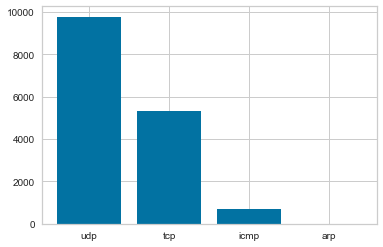

udp     9780
tcp     5343
icmp     713
arp       11
Name: Proto, dtype: int64


In [6]:
protocol_counts = benign_data.Proto.value_counts()
plt.bar(protocol_counts.index, protocol_counts)
plt.show()
print(protocol_counts)

The non-malicious traffic contains a very less proportion of ICMP packets compared to the one observed for an infected host. Therefore, it is safe to make an assumption that if abnormally large number of ICMP packets are seen, then it probably could be an infected host acting in the network. 

It can also be seen from below given boxplots on the basis of total packets sent, that an infected host is specific in its behaviour in terms of the type of traffic generated. On the contrary, the traffic generated by other hosts on the network is more spread out in terms of the total packets in the netflow. Such features can be successfully used to generate signatures for infected hosts in the network.

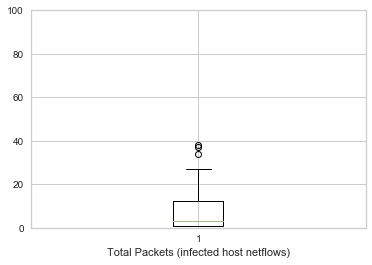

In [7]:
# boxplot of the infected host packet values
plt.boxplot(infected_hosts_data.TotPkts.value_counts())
plt.xlabel("Total Packets (infected host netflows)")
plt.ylim(0, 100)
plt.show()

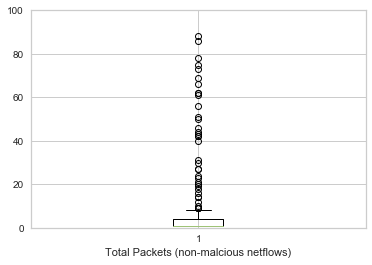

In [8]:
# boxplot of the normal traffic (non-malicious) packet values
plt.boxplot(benign_data.TotPkts.value_counts())
plt.xlabel("Total Packets (non-malcious netflows)")
plt.ylim(0, 100 )
plt.show()

#### b. Discretize selected features

After removing the background data, we label encode `Proto` and `Dir`. Since `Proto`, `TotPkts` and `TotBytes` have the capability identify botnet traffic from normal benign ones, we can choose these features to be discretized into quantiles. We use KBinsDiscretizer to discretize `TotPkts` and `TotBytes` and choose the optimum number through the Elbow method. 

In [59]:
# removing the background data
training_data = original_data.loc[~original_data.Label.str.contains('Background', regex=True, na=False), :]
print(len(training_data))

# dropping unecessary features from the data according to the paper
training_data = training_data.drop(['Sport','Dport', 'State', 'sTos', 'dTos', 'SrcBytes', 'Label'], axis='columns')

# label encoding Protocol and Dir
label_encoder = LabelEncoder()
training_data['Proto'] = label_encoder.fit_transform(training_data['Proto']) 
training_data['Dir'] = label_encoder.fit_transform(training_data['Dir'])
training_data.head()

122199


,StartTime,Dur,Proto,SrcAddr,Dir,DstAddr,TotPkts,TotBytes
532,2011/08/18 10:19:15.693956,3587.569824,2,147.32.84.164,4,74.125.232.215,3049,978731
822,2011/08/18 10:19:18.143576,198.072739,2,147.32.84.164,4,74.125.232.197,14,924
842,2011/08/18 10:19:18.303590,197.928329,2,147.32.84.164,4,209.85.149.138,14,924
1021,2011/08/18 10:19:19.838272,0.000399,3,147.32.84.170,3,147.32.80.9,2,400
1022,2011/08/18 10:19:19.839123,0.000400,3,147.32.84.170,3,147.32.80.9,2,400


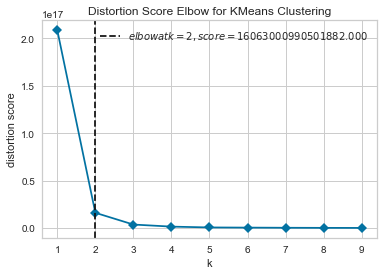

In [60]:
# finding the elbow value
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model,timings=False,k=(1,10))

# Fit the data to the visualizer
visualizer.fit(training_data[['Dur','TotPkts','TotBytes']])        

# Finalize and render the figure
visualizer.show()

In [61]:
# as can be seen from above graph, elbow is approximately at k = 2, Using k=2 for the number of bins
discretizer = KBinsDiscretizer(n_bins=2, encode='ordinal', strategy='quantile')
training_discrete = discretizer.fit_transform(training_data[['Dur','TotPkts','TotBytes']])

# converting the ndarray to dataframe
temp_df = pd.DataFrame(data=training_discrete, columns=['Dur','TotPkts','TotBytes'])

# migrating the discretized values to the training data set
training_data['Dur'] = temp_df['Dur'].values
training_data['TotPkts'] = temp_df['TotPkts'].values
training_data['TotBytes'] = temp_df['TotBytes'].values
display(training_data.head(10))

D:\Anaconda3\lib\site-packages\sklearn\preprocessing\_discretization.py:197: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 0 are removed. Consider decreasing the number of bins.
  'decreasing the number of bins.' % jj)
D:\Anaconda3\lib\site-packages\sklearn\preprocessing\_discretization.py:197: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 1 are removed. Consider decreasing the number of bins.
  'decreasing the number of bins.' % jj)


,StartTime,Dur,Proto,SrcAddr,Dir,DstAddr,TotPkts,TotBytes
532,2011/08/18 10:19:15.693956,0.0,2,147.32.84.164,4,74.125.232.215,0.0,1.0
822,2011/08/18 10:19:18.143576,0.0,2,147.32.84.164,4,74.125.232.197,0.0,0.0
842,2011/08/18 10:19:18.303590,0.0,2,147.32.84.164,4,209.85.149.138,0.0,0.0
1021,2011/08/18 10:19:19.838272,0.0,3,147.32.84.170,3,147.32.80.9,0.0,0.0
1022,2011/08/18 10:19:19.839123,0.0,3,147.32.84.170,3,147.32.80.9,0.0,0.0
1023,2011/08/18 10:19:19.840040,0.0,2,147.32.84.170,0,209.85.148.105,0.0,0.0
1145,2011/08/18 10:19:20.966671,0.0,2,147.32.84.170,4,64.12.73.165,0.0,1.0
1146,2011/08/18 10:19:20.966678,0.0,2,147.32.84.170,4,64.12.73.133,0.0,1.0
1147,2011/08/18 10:19:20.966721,0.0,2,147.32.84.170,4,205.188.11.14,0.0,1.0
1404,2011/08/18 10:19:23.450600,0.0,2,147.32.84.164,4,64.12.73.134,0.0,1.0


We use the discretized data to combine the features and encode each netflow. This is done using the Algorithm 1 found in the paper "Learning Behavioral Fingerprints From Netflows Using Timed Automata", by Pellegrino, G. et al. The encoded value can be found in the 'code' attribute seen in the displayed dataframe. As shown above in the visualization section, the Protocol, and the total packets and bytes in every flow helps in characterizing a malicious netflow. Therefore, we use `Proto`, `TotPkts` and `TotBytes` attributes to encode the netflows as well.

In [62]:
# encoding the features and returning one code (required descritized value) per netflow
proto_counts = len(training_data.Proto.unique())
pkt_counts = len(training_data.TotPkts.unique())
byte_counts = len(training_data.TotBytes.unique())

attribute_mapping_counts = [proto_counts, pkt_counts, byte_counts]
attribute_mapping_columns = ['Proto','TotPkts','TotBytes']
space_size = reduce(lambda x,y: x*y, attribute_mapping_counts)

codes = np.zeros(len(training_data))
training_data['code'] = codes
training_data = training_data.reset_index()

#adding the columns "code" to display the required discretized combined value
for row in range(len(training_data)):
    code = 0
    ss = space_size
    for i in range(len(attribute_mapping_columns)):
        code = code + training_data.at[row, attribute_mapping_columns[i]] * (ss / attribute_mapping_counts[i])
        ss = (ss / attribute_mapping_counts[i])
    training_data.at[row,'code'] = code

#printing the dataset with code value per netflow
training_data

,index,StartTime,Dur,Proto,SrcAddr,Dir,DstAddr,TotPkts,TotBytes,code
0,532,2011/08/18 10:19:15.693956,0.0,2,147.32.84.164,4,74.125.232.215,0.0,1.0,5.0
1,822,2011/08/18 10:19:18.143576,0.0,2,147.32.84.164,4,74.125.232.197,0.0,0.0,4.0
2,842,2011/08/18 10:19:18.303590,0.0,2,147.32.84.164,4,209.85.149.138,0.0,0.0,4.0
3,1021,2011/08/18 10:19:19.838272,0.0,3,147.32.84.170,3,147.32.80.9,0.0,0.0,6.0
4,1022,2011/08/18 10:19:19.839123,0.0,3,147.32.84.170,3,147.32.80.9,0.0,0.0,6.0
...,...,...,...,...,...,...,...,...,...,...
122194,1309670,2011/08/18 15:04:58.033603,0.0,1,147.32.84.164,3,147.32.96.69,0.0,0.0,2.0
122195,1309736,2011/08/18 15:04:59.032685,0.0,1,147.32.84.164,3,147.32.96.69,0.0,0.0,2.0
122196,1309782,2011/08/18 15:04:59.532629,0.0,3,147.32.84.170,3,147.32.80.9,0.0,0.0,6.0
122197,1309783,2011/08/18 15:04:59.533932,0.0,3,147.32.84.170,3,147.32.80.9,0.0,0.0,6.0


### Frequent Task - Shipra Sharma

For the frequent task we implement the following steps:
1. Derive the 3-grams based on the code value (the one that we got from discretization task) and find 3-grams' original frequency.
2. Select 10 random 3-grams which serve as the algorithm's counter (moderator dictionary)
3. Implement the space saving algorithm to find the top 10 most frequent 3-grams

In [63]:
# preparing the 3-gram list 
n_grams = list(trigrams(training_data.code.values))
n_grams

[(5.0, 4.0, 4.0),
 (4.0, 4.0, 6.0),
 (4.0, 6.0, 6.0),
 (6.0, 6.0, 4.0),
 (6.0, 4.0, 5.0),
 (4.0, 5.0, 5.0),
 (5.0, 5.0, 5.0),
 (5.0, 5.0, 5.0),
 (5.0, 5.0, 5.0),
 (5.0, 5.0, 5.0),
 (5.0, 5.0, 4.0),
 (5.0, 4.0, 5.0),
 (4.0, 5.0, 5.0),
 (5.0, 5.0, 5.0),
 (5.0, 5.0, 6.0),
 (5.0, 6.0, 6.0),
 (6.0, 6.0, 4.0),
 (6.0, 4.0, 6.0),
 (4.0, 6.0, 6.0),
 (6.0, 6.0, 5.0),
 (6.0, 5.0, 7.0),
 (5.0, 7.0, 5.0),
 (7.0, 5.0, 6.0),
 (5.0, 6.0, 6.0),
 (6.0, 6.0, 4.0),
 (6.0, 4.0, 5.0),
 (4.0, 5.0, 5.0),
 (5.0, 5.0, 5.0),
 (5.0, 5.0, 5.0),
 (5.0, 5.0, 5.0),
 (5.0, 5.0, 5.0),
 (5.0, 5.0, 5.0),
 (5.0, 5.0, 4.0),
 (5.0, 4.0, 6.0),
 (4.0, 6.0, 6.0),
 (6.0, 6.0, 4.0),
 (6.0, 4.0, 5.0),
 (4.0, 5.0, 5.0),
 (5.0, 5.0, 4.0),
 (5.0, 4.0, 7.0),
 (4.0, 7.0, 6.0),
 (7.0, 6.0, 6.0),
 (6.0, 6.0, 4.0),
 (6.0, 4.0, 7.0),
 (4.0, 7.0, 6.0),
 (7.0, 6.0, 6.0),
 (6.0, 6.0, 5.0),
 (6.0, 5.0, 6.0),
 (5.0, 6.0, 6.0),
 (6.0, 6.0, 6.0),
 (6.0, 6.0, 6.0),
 (6.0, 6.0, 4.0),
 (6.0, 4.0, 6.0),
 (4.0, 6.0, 6.0),
 (6.0, 6.0, 4.0),
 (6.0, 4.0

In [64]:
#converting the list into readable 3-gram strings
string_grams = list(training_data.code.values)
for i in range(len(string_grams)-2):
    string_grams[i]=str(int(string_grams[i]))+str(int(string_grams[i+1]))+str(int(string_grams[i+2]))
string_grams = string_grams[:-2]

#sorting the 3-grams as per their original frequencies
sorted_list = Counter(string_grams).most_common()
sorted_list

[('333', 105391),
 ('666', 3389),
 ('664', 1678),
 ('466', 1432),
 ('646', 1397),
 ('566', 1358),
 ('665', 1268),
 ('555', 1206),
 ('656', 1039),
 ('556', 332),
 ('655', 280),
 ('222', 272),
 ('444', 200),
 ('336', 196),
 ('633', 177),
 ('266', 174),
 ('645', 163),
 ('363', 157),
 ('226', 113),
 ('455', 95),
 ('456', 86),
 ('446', 81),
 ('565', 75),
 ('662', 75),
 ('642', 72),
 ('777', 71),
 ('644', 67),
 ('366', 66),
 ('626', 60),
 ('622', 54),
 ('433', 46),
 ('422', 46),
 ('663', 43),
 ('262', 42),
 ('544', 41),
 ('464', 40),
 ('554', 39),
 ('766', 36),
 ('232', 30),
 ('426', 29),
 ('564', 27),
 ('335', 27),
 ('334', 27),
 ('546', 26),
 ('647', 26),
 ('465', 26),
 ('654', 26),
 ('533', 26),
 ('445', 23),
 ('652', 23),
 ('353', 23),
 ('522', 22),
 ('343', 22),
 ('643', 21),
 ('322', 21),
 ('636', 20),
 ('223', 19),
 ('476', 15),
 ('776', 15),
 ('545', 14),
 ('526', 14),
 ('454', 14),
 ('477', 12),
 ('462', 12),
 ('443', 9),
 ('242', 9),
 ('323', 9),
 ('552', 8),
 ('344', 8),
 ('553', 

In [65]:
#finding top 10 original 3-grams
top_ten_original_3gram = sorted_list[:10]
top_ten_original_3gram

[('333', 105391),
 ('666', 3389),
 ('664', 1678),
 ('466', 1432),
 ('646', 1397),
 ('566', 1358),
 ('665', 1268),
 ('555', 1206),
 ('656', 1039),
 ('556', 332)]

In [66]:
# find 10 random 3-grams tp pre-populate the monitored dictionary
random_ten = random.sample(set(string_grams),10)
print(random_ten)

# preparing the monitered counter with 10 random 3-gram and assigning them 0 value
monitored = {}
for t in random_ten:
    monitored[t] = 0
monitored

['353', '272', '626', '665', '233', '534', '552', '624', '633', '244']


{'353': 0,
 '272': 0,
 '626': 0,
 '665': 0,
 '233': 0,
 '534': 0,
 '552': 0,
 '624': 0,
 '633': 0,
 '244': 0}

In [67]:
# function to implement the space saving algorithm as per the paper
def spaceSaving(data):
    for e in data:
        if e in monitored:
            monitored[e] += 1
        else:
            min_val = min(monitored.values())
            for k in monitored.keys():
                if monitored[k] == min_val:
                    monitored[e] = min_val+1
                    del monitored[k]
                    break
                
            frequency = min_val + 1
        print(monitored)
    return frequency

In [68]:
# running the space saving algorithm
frequency = spaceSaving(string_grams)
print(frequency)

{'272': 0, '626': 0, '665': 0, '233': 0, '534': 0, '552': 0, '624': 0, '633': 0, '244': 0, '544': 1}
{'626': 0, '665': 0, '233': 0, '534': 0, '552': 0, '624': 0, '633': 0, '244': 0, '544': 1, '446': 1}
{'665': 0, '233': 0, '534': 0, '552': 0, '624': 0, '633': 0, '244': 0, '544': 1, '446': 1, '466': 1}
{'233': 0, '534': 0, '552': 0, '624': 0, '633': 0, '244': 0, '544': 1, '446': 1, '466': 1, '664': 1}
{'534': 0, '552': 0, '624': 0, '633': 0, '244': 0, '544': 1, '446': 1, '466': 1, '664': 1, '645': 1}
{'552': 0, '624': 0, '633': 0, '244': 0, '544': 1, '446': 1, '466': 1, '664': 1, '645': 1, '455': 1}
{'624': 0, '633': 0, '244': 0, '544': 1, '446': 1, '466': 1, '664': 1, '645': 1, '455': 1, '555': 1}
{'624': 0, '633': 0, '244': 0, '544': 1, '446': 1, '466': 1, '664': 1, '645': 1, '455': 1, '555': 2}
{'624': 0, '633': 0, '244': 0, '544': 1, '446': 1, '466': 1, '664': 1, '645': 1, '455': 1, '555': 3}
{'624': 0, '633': 0, '244': 0, '544': 1, '446': 1, '466': 1, '664': 1, '645': 1, '455': 1, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'664': 734, '656': 477, '566': 588, '666': 941, '646': 676, '466': 679, '665': 550, '555': 501, '333': 24558, '533': 367}
{'664': 734, '656': 477, '566': 588, '666': 941, '646': 676, '466': 679, '665': 550, '555': 501, '333': 24559, '533': 367}
{'664': 734, '656': 477, '566': 588, '666': 941, '646': 676, '466': 679, '665': 550, '555': 501, '333': 24560, '533': 367}
{'664': 734, '656': 477, '566': 588, '666': 941, '646': 676, '466': 679, '665': 550, '555': 501, '333': 24561, '533': 367}
{'664': 734, '656': 477, '566': 588, '666': 941, '646': 676, '466': 679, '665': 550, '555': 501, '333': 24562, '533': 367}
{'664': 734, '656': 477, '566': 588, '666': 941, '646': 676, '466': 679, '665': 550, '555': 501, '333': 24563, '533': 367}
{'664': 734, '656': 477, '566': 588, '666': 941, '646': 676, '466': 679, '665': 550, '555': 501, '333': 24564, '533': 367}
{'664': 734, '656': 477, '566': 588, '666': 941, '646': 676, '466': 679, '665': 550, '555': 501, '333': 24565, '533': 367}
{'664': 734, '6

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'664': 1579, '666': 3309, '333': 83509, '566': 1444, '646': 1474, '466': 1475, '633': 1438, '335': 1439, '353': 1439, '533': 1439}
{'664': 1579, '666': 3309, '333': 83510, '566': 1444, '646': 1474, '466': 1475, '633': 1438, '335': 1439, '353': 1439, '533': 1439}
{'664': 1579, '666': 3309, '333': 83511, '566': 1444, '646': 1474, '466': 1475, '633': 1438, '335': 1439, '353': 1439, '533': 1439}
{'664': 1579, '666': 3309, '333': 83512, '566': 1444, '646': 1474, '466': 1475, '633': 1438, '335': 1439, '353': 1439, '533': 1439}
{'664': 1579, '666': 3309, '333': 83513, '566': 1444, '646': 1474, '466': 1475, '633': 1438, '335': 1439, '353': 1439, '533': 1439}
{'664': 1579, '666': 3309, '333': 83514, '566': 1444, '646': 1474, '466': 1475, '633': 1438, '335': 1439, '353': 1439, '533': 1439}
{'664': 1579, '666': 3309, '333': 83515, '566': 1444, '646': 1474, '466': 1475, '633': 1438, '335': 1439, '353': 1439, '533': 1439}
{'664': 1579, '666': 3309, '333': 83516, '566': 1444, '646': 1474, '466': 14

The ten most frquent 3-grams as per the space saving algorithm can be observed as follows:

| 3-gram | Computed Frequency | Original Frequency |
|--------|--------------------|--------------------|
| 664    | 1678               | 1678               |
| 666    | 3393               | 3389               |
| 333    | 105745             | 105391             |
| 222    | 1691               | 272                |
| 422    | 1615               | 46                 |
| 226    | 1617               | 113                |
| 266    | 1616               | 174                |
| 642    | 1615               | 72                 |
| 262    | 1613               | 42                 |
| 622    | 1614               | 54                 |

From the above results we can easily conclude that the 3-grams which have larger frequeries in the orginal data like 333, 666, 664 are estimated somewhat the same with minimal errors but the ones that have smaller frequencies in the orginal data are estimated with larger values leading to the limitations in algorithm's calculation. It might be because of the key replacement logic that the algorithm uses, i.e. the element with minimum occurance would be replaced first if a new element is found in the data stream. Also, only three 3-grams collide in the top-10 most frequent 3-grams original vs space saving algorithm list. These elements are the most frequent ones in both of these lists (333, 666 and 664). Hence, from our implementation and analysis, we can deduce that Space saving algorithm works almost correctly for the elements with larger occurences but fails to justify the estimation for less frequent entries in a given stream.

### Sketching Task - Shipra Sharma

To implement the sketching task we have followed the following steps:
1. Implement a class to calculate the hash values
2. Implement a method to calculate width and height of the hash table, create the sketch and count the frequencies of the 3-grams
3. Prepare the input data for the min count sketch implementation
4. Call the function using different values of epsilon and delta and find the top 10 most frequent 3-grams 

In [18]:
#class to implement Count Min Sketch function
class CountMinSketch:
    
    def __init__(self, width, depth):
        self.size = width*depth
        self.width = width
        self.hashing_counter = depth
        self.count_min_arr =  [[0]*width for i in range(depth)]
        
    def add(self, string):
        for seed in range(self.hashing_counter):
            hash_result = mmh3.hash(string, seed) % self.width
            self.count_min_arr[seed][hash_result] += 1
        
    def point(self, string):
        minimum = 10000000000
        for seed in range(self.hashing_counter):
            hash_result = mmh3.hash(string, seed) % self.width
            if self.count_min_arr[seed][hash_result]<minimum:
                minimum = self.count_min_arr[seed][hash_result]
        return minimum

In [19]:
e=math.exp(1)

#funtion to calculate the top 10 most frequent 3-grams using count min sketch
def count_min_sketch (eps, delt, d):
    epsilon = eps
    delta = delt
    data = d
    width = round(e/epsilon)
    height = round(math.log(1/delta))
    count_min = CountMinSketch(width, height)
    print("Width is: " + str(width))
    print("Height is: " + str(height))
    
# adding the three-grams to the sketch
    for three_gram in data:
        count_min.add(three_gram)
        
#find their frequencies
    count_min_dictionary = {}
    for three_gram in data:
        count_min_dictionary[three_gram] = count_min.point(three_gram)

# Sort them according to their value to find the 10 most frequent ones
    sorted_count_min = Counter(count_min_dictionary).most_common()
    top_ten_count_min = sorted_count_min[:10]
    print(top_ten_count_min)
    

In [20]:
# get the number of times each 3-gram is occuring
original_freq_three_gram = Counter(string_grams)
original_freq_three_gram_list = sorted(string_grams, key=original_freq_three_gram.get, reverse=True)

#using group by function to get values of only the original frequencies
[len(list(group)) for key, group in groupby(original_freq_three_gram_list)]

[105391,
 3389,
 1678,
 1432,
 1397,
 1358,
 1268,
 1206,
 1039,
 332,
 280,
 272,
 200,
 196,
 177,
 174,
 163,
 157,
 113,
 95,
 86,
 81,
 42,
 11,
 1,
 47,
 28,
 3,
 4,
 14,
 72,
 71,
 67,
 66,
 60,
 54,
 28,
 19,
 18,
 27,
 43,
 42,
 41,
 40,
 39,
 36,
 30,
 29,
 7,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 4,
 1,
 1,
 1,
 1,
 5,
 1,
 3,
 1,
 2,
 6,
 4,
 1,
 14,
 1,
 3,
 2,
 2,
 2,
 4,
 1,
 6,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 4,
 1,
 5,
 1,
 1,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 1,
 2,
 1,
 1,
 1,
 21,
 2,
 1,
 1,
 1,
 1,
 2,
 1,
 4,
 2,
 1,
 2,
 2,
 1,
 1,
 5,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 3,
 1,
 3,
 2,
 1,
 1,
 4,
 5,
 2,
 2,
 1,
 3,
 1,
 1,
 18,
 8,
 3,
 1,
 14,
 2,
 5,
 10,
 1,
 12,
 12,
 10,
 9,
 20,
 9,
 1,
 12,
 20,
 19,
 5,
 1,
 3,
 3,
 4,
 6,
 2,
 3,
 1,
 2,
 1,
 2,
 1,
 3,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 3,
 1,
 2,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 5,
 4,
 7,
 1,
 1,
 5,
 3,
 2,
 1,
 9,
 5,
 9,
 4,
 1,
 3,
 4,
 5,
 2,
 

In [21]:
count_min_sketch(0.0001,0.0001,original_freq_three_gram_list)
count_min_sketch(0.1,0.0001,original_freq_three_gram_list)
count_min_sketch(0.01,0.1,original_freq_three_gram_list)
count_min_sketch(0.1,0.1,original_freq_three_gram_list)

Width is: 27183
Height is: 9
[('333', 105391), ('666', 3389), ('664', 1678), ('466', 1432), ('646', 1397), ('566', 1358), ('665', 1268), ('555', 1206), ('656', 1039), ('556', 332)]
Width is: 27
Height is: 9
[('333', 105422), ('666', 3414), ('664', 1689), ('646', 1472), ('466', 1461), ('566', 1367), ('665', 1276), ('555', 1209), ('656', 1059), ('556', 419)]
Width is: 272
Height is: 2
[('333', 105391), ('666', 3391), ('664', 1678), ('466', 1432), ('646', 1398), ('566', 1358), ('665', 1270), ('555', 1206), ('656', 1040), ('556', 332)]
Width is: 27
Height is: 2
[('333', 105422), ('666', 3594), ('425', 1788), ('646', 1761), ('355', 1761), ('664', 1755), ('466', 1564), ('566', 1515), ('265', 1515), ('606', 1515)]


In this task, we computed the top-10 3-grams using the Count-min Sketch Algorithm. The algorithm works on a hash matrix that is obtained by multiplying height(depth) and widht which are computed using two parameters, namely delta (error probability) and epsilon (error factor). The width is e/epsilon and the depth is calculated by the formula log(1/delta). Using the algorithm we got the following results:


| Top- 10 Width = 27183 Height = 9 | Computed Frequency | Original Frequency | Top - 10 Width = 27 Height = 2 | Computed Frequency | Original Frequency |
|----------------------------------|--------------------|--------------------|--------------------------------|--------------------|--------------------|
| 333                              | 105391             | 105391             | 333                            | 105422             | 105391             |
| 666                              | 3389               | 3389               | 666                            | 3594               | 3389               |
| 664                              | 1678               | 1678               | 425                            | 1788               | 3                  |
| 466                              | 1432               | 1432               | 646                            | 1761               | 1397               |
| 646                              | 1397               | 1397               | 355                            | 1761               | 1397               |
| 566                              | 1358               | 1358               | 664                            | 1755               | 1678               |
| 665                              | 1268               | 1268               | 466                            | 1564               | 1432               |
| 555                              | 1206               | 1206               | 566                            | 1515               | 1358               |
| 656                              | 1039               | 1039               | 265                            | 1515               | 5                  |
| 556                              | 332                | 332                | 606                            | 1515               | 2                  |


From the above result, it can be concluded that with larger width, the algorithm estimates the exact results as compared to the original data. The top-10 3-grams of the original stream matches with the estimated top-10 3-grams with the exact frequencies, hence, producing no errors. But this increases the space required by the sketch. 
However, if the width is decreased, like in the second result, not only the top-10 3-gram list's elements vary from the original data but the frequencies are also estimated incorrectly. The main reason behind this is that larger width causes the matrix to cause less errors.
Thus, from all this analysis one can deduce that if correct tuning of the parameters is done in count-min sketch algrotihm, it produces almost 100% accuracy with some compromises in the memory requirements.

It can also be observed from the above implementations that the run-time and frequency estimation of count-min sketch algorithm is better than the space saving algorithm.

### Min-wise locality sensitive hashing task - Sudharshan Swaminathan

We find all the unique IP connection pairs, i.e if all netflows having unique A-B, B-A pairs are found and put together. For each connection pair found, we then take the values of the encoded attribute and form 3-grams from that column. This 3-gram formation is done for each unique pair and therefore, is right padded in case there are less than 3-grams left in the end. `ip_pairs` is a dictionary containing all unique IP pairs and their corresponding list of encoded values. `n_grams` contains all the possible 3-grams computed for all connection pairs. `ip_pair_grams` consists of all unique connection pairs and their corresponding 3-grams.

In [22]:
# Finding all unique connection pairs
ip_pairs = {}
print(len(training_data))
display(training_data)
for row in range(len(training_data)):
    l = [training_data.at[row, 'SrcAddr'], training_data.at[row, 'DstAddr']]
    l.sort()
    ip_pair = reduce(lambda x, y: x+'-'+y, l)
    if ip_pair not in ip_pairs.keys():
        ip_pairs[ip_pair] = [training_data.at[row, 'code']]
    else:
        ip_pairs[ip_pair].append(training_data.at[row, 'code'])

# for row in range(len(training_data)):
#     l = [training_data.at[row, 'SrcAddr'], training_data.at[row, 'DstAddr']]
#     l.sort()        
#     ip_pair = reduce(lambda x, y: x+'-'+y, l)
#     for ip_pair in ip_pairs.keys()
        
print("No. of unique connection pairs: ", len(ip_pairs.keys()))

122199


,index,StartTime,Dur,Proto,SrcAddr,Dir,DstAddr,TotPkts,TotBytes,code
0,532,2011/08/18 10:19:15.693956,0.0,2,147.32.84.164,4,74.125.232.215,0.0,1.0,5.0
1,822,2011/08/18 10:19:18.143576,0.0,2,147.32.84.164,4,74.125.232.197,0.0,0.0,4.0
2,842,2011/08/18 10:19:18.303590,0.0,2,147.32.84.164,4,209.85.149.138,0.0,0.0,4.0
3,1021,2011/08/18 10:19:19.838272,0.0,3,147.32.84.170,3,147.32.80.9,0.0,0.0,6.0
4,1022,2011/08/18 10:19:19.839123,0.0,3,147.32.84.170,3,147.32.80.9,0.0,0.0,6.0
...,...,...,...,...,...,...,...,...,...,...
122194,1309670,2011/08/18 15:04:58.033603,0.0,1,147.32.84.164,3,147.32.96.69,0.0,0.0,2.0
122195,1309736,2011/08/18 15:04:59.032685,0.0,1,147.32.84.164,3,147.32.96.69,0.0,0.0,2.0
122196,1309782,2011/08/18 15:04:59.532629,0.0,3,147.32.84.170,3,147.32.80.9,0.0,0.0,6.0
122197,1309783,2011/08/18 15:04:59.533932,0.0,3,147.32.84.170,3,147.32.80.9,0.0,0.0,6.0


No. of unique connection pairs:  557


In [23]:
# create all possible 3-grams and put them along with their corresponding IP pairs
n_grams = []
ip_pair_grams = {}
for connection in ip_pairs.keys():
    grams = list(ngrams(ip_pairs[connection], 3, pad_right=True))
    ip_pair_grams[connection] = grams
    for g in grams:
        if g not in n_grams:
            n_grams.append(g)

We use the above formed 3-grams as the rows and the connection pairs as the columns for creating profiles. For each possible 3-gram formed, we check whether the 3-gram exists for the particular connection pair or not. If it exists, we place a `1` and a `0` otherwise. Doing this gives us a binary matrix that will let us calculate the jaccard similarity between 2 connection pairs. This matrix is stored in `connection_profile`.

In [24]:
dummy_data = np.zeros((len(n_grams), len(ip_pairs.keys())))
connection_profile = pd.DataFrame(dummy_data, columns=list(ip_pairs.keys()))
connection_profile['ngrams'] = n_grams
connection_profile.set_index('ngrams',inplace=True)
for gram in n_grams:
    for connection in ip_pair_grams.keys():
        if gram in ip_pair_grams[connection]:
            connection_profile.at[gram, connection] = 1

connection_profile

,147.32.84.164-74.125.232.215,147.32.84.164-74.125.232.197,147.32.84.164-209.85.149.138,147.32.80.9-147.32.84.170,147.32.84.170-209.85.148.105,147.32.84.170-64.12.73.165,147.32.84.170-64.12.73.133,147.32.84.170-205.188.11.14,147.32.84.164-64.12.73.134,147.32.84.164-205.188.8.253,...,147.32.84.207-74.125.232.199,147.32.84.208-213.92.8.4,147.32.84.209-174.143.119.91,147.32.84.209-74.125.232.194,130.239.18.172-147.32.84.193,147.32.87.36-90.177.228.23,147.32.80.9-147.32.84.189,147.32.84.164-77.79.154.217,147.32.84.207-213.92.8.4,140.211.167.98-147.32.84.165
ngrams,,,,,,,,,,,,,,,,,,,,,
"(5.0, 5.0, 5.0)",1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(5.0, 5.0, None)",1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(5.0, None, None)",1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(4.0, 5.0, 4.0)",0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(5.0, 4.0, 4.0)",0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(4.0, 4.0, 5.0)",0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(4.0, 5.0, 5.0)",0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(6.0, 6.0, 6.0)",0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(6.0, 6.0, None)",0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


We use the above matrix to calculate the pair-wise similarity between connections using jaccard similarity. We have 557 unique connection pairs. Here we calculate create a 2 dimensional matrix of dimensions of 557 * 557, and if the similarity between any columns is > 0.8, then we record a `1` in the cell corresponding to these 2 columns. For example, if the jaccard similarity, sim(C1,c2) > 0.8, then we record a `1` in (C1,C2) in this new matrix represented by `similarity_matrix1` below. We also measure the average time it takes to find the pairwise jaccard similarities between all the connection pairs over 10 runs, which is approximately 160 seconds. 

In [25]:
#NOTE: THIS TAKES A LOT OF TIME TO EXECUTE. PLEASE BE PATIENT!

def similarity_matrix_from_profile(connection_profile, threshold=0.8):
    similarity_matrix1 = pd.DataFrame(columns=connection_profile.columns)
    columns_values = connection_profile.columns.values
    for c1 in range(len(connection_profile.columns)):
        sdata = {}
        for c3 in range(0,c1):
                sdata[columns_values[c3]] = similarity_matrix1.iloc[c3,c1]
        for c2 in range(c1, len(connection_profile.columns)):
            score = jaccard_score(connection_profile.iloc[:,c1], connection_profile.iloc[:,c2])
            if score > threshold:
                sdata[columns_values[c2]] = 1
            else:
                sdata[columns_values[c2]] = 0

        similarity_matrix1 = similarity_matrix1.append(sdata, ignore_index = True)
    return similarity_matrix1


# computing jaccard similarity matrix using threshold of 0.8
print("The exeuction time for calculating the jaccard similarity matrix for an average of 10 times: ", (timeit.Timer(lambda : similarity_matrix_from_profile(connection_profile, 0.8)).timeit(number=10))/10)
similarity_matrix1 = similarity_matrix_from_profile(connection_profile, 0.8)


The exeuction time for calculating the jaccard similarity matrix for an average of 10 times:  180.31597057999997


In [26]:
similarity_matrix1.head()

,147.32.84.164-74.125.232.215,147.32.84.164-74.125.232.197,147.32.84.164-209.85.149.138,147.32.80.9-147.32.84.170,147.32.84.170-209.85.148.105,147.32.84.170-64.12.73.165,147.32.84.170-64.12.73.133,147.32.84.170-205.188.11.14,147.32.84.164-64.12.73.134,147.32.84.164-205.188.8.253,...,147.32.84.207-74.125.232.199,147.32.84.208-213.92.8.4,147.32.84.209-174.143.119.91,147.32.84.209-74.125.232.194,130.239.18.172-147.32.84.193,147.32.87.36-90.177.228.23,147.32.80.9-147.32.84.189,147.32.84.164-77.79.154.217,147.32.84.207-213.92.8.4,140.211.167.98-147.32.84.165
0,1,0,0,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


The hash functions are then created randomly and are used as was defined in the lectures. That is, every row's number is hashed and for each connection pair having a `1` in its connection profile, the minimum between the hash value and the already present value is taken. The subsequently formed signature matrix is present in `signature_matrix`.

In [27]:
# creating random hash functions
def create_hash_funcs():
    def rand_prime():
        while True:
            p = random.randrange(2 ** 32, 2 ** 34, 2)
            if all(p % n != 0 for n in range(3, int((p ** 0.5) + 1), 2)):
                return p
    m = 2 ** 32 - 1
    p = rand_prime()
    a = random.randint(0, p)
    if a % 2 == 0:
        a += 1
    b = random.randint(0, p)
    def h(x):
        return ((a * x + b) % p) % m
    return h

In [28]:
# running the hash function through each connection pair and each row 
# and selecting the min(value_at_row, row_hash_value) for each cell containing a 1 in that column
def create_signature_matrix(connection_profile, hashes):
    # creating hash functions first
    hash_funcs = []
    for i in range(hashes):
        hash_funcs.append(create_hash_funcs())
    # creating signature matrix
    dummy_data = np.empty((hashes, len(connection_profile.columns)))
    dummy_data[:] = np.nan
    signature_matrix = pd.DataFrame(dummy_data, columns=list(connection_profile.columns))

    # dropping index to make it stop messing up my computations :-P
    connection_profile = connection_profile.reset_index(drop=True)

    # iterating through each row per column per hash function
    for row in range(len(connection_profile)):
        hash_values = [h(row+1) for h in hash_funcs]
        for column in signature_matrix.columns:
            if connection_profile.at[row, column] == 1:
                for j in range(len(signature_matrix)):
                    if math.isnan(signature_matrix.at[j, column]):
                        signature_matrix.at[j, column] = hash_values[j]
                    else:
                        signature_matrix.at[j, column] = min(hash_values[j], signature_matrix.at[j, column])
    return signature_matrix

In [29]:
signature_matrix = create_signature_matrix(connection_profile, 30)
signature_matrix.head()

,147.32.84.164-74.125.232.215,147.32.84.164-74.125.232.197,147.32.84.164-209.85.149.138,147.32.80.9-147.32.84.170,147.32.84.170-209.85.148.105,147.32.84.170-64.12.73.165,147.32.84.170-64.12.73.133,147.32.84.170-205.188.11.14,147.32.84.164-64.12.73.134,147.32.84.164-205.188.8.253,...,147.32.84.207-74.125.232.199,147.32.84.208-213.92.8.4,147.32.84.209-174.143.119.91,147.32.84.209-74.125.232.194,130.239.18.172-147.32.84.193,147.32.87.36-90.177.228.23,147.32.80.9-147.32.84.189,147.32.84.164-77.79.154.217,147.32.84.207-213.92.8.4,140.211.167.98-147.32.84.165
0,2.551893e+08,2.551893e+08,2.551893e+08,1.772935e+08,5.171831e+08,2.551893e+08,2.551893e+08,2.551893e+08,5.950789e+08,5.950789e+08,...,2.510819e+09,2.551893e+08,2.551893e+08,2.510819e+09,2.510819e+09,2.510819e+09,4.132371e+09,3.406890e+09,2.510819e+09,2.510819e+09
1,1.584175e+09,1.791951e+08,1.791951e+08,1.225175e+09,2.251330e+07,1.584175e+09,1.584175e+09,1.584175e+09,2.251330e+07,2.251330e+07,...,1.866521e+09,3.630500e+09,3.630500e+09,1.866521e+09,1.866521e+09,1.866521e+09,3.271500e+09,3.038165e+09,1.866521e+09,1.866521e+09
2,1.376946e+09,1.284831e+09,1.376946e+09,2.749741e+09,1.284831e+09,1.376946e+09,1.376946e+09,1.376946e+09,1.384594e+09,1.384594e+09,...,1.384594e+09,1.376946e+09,1.376946e+09,1.384594e+09,1.384594e+09,1.384594e+09,4.276061e+09,1.522711e+09,1.384594e+09,1.384594e+09
3,2.463735e+08,2.463735e+08,2.463735e+08,6.519046e+08,3.815505e+08,2.463735e+08,2.463735e+08,2.463735e+08,1.567784e+09,1.567784e+09,...,1.567784e+09,2.463735e+08,2.463735e+08,1.567784e+09,1.567784e+09,1.567784e+09,3.377326e+09,1.556340e+08,1.567784e+09,1.567784e+09
4,4.514830e+08,4.514830e+08,4.514830e+08,1.110815e+09,4.514830e+08,4.514830e+08,4.514830e+08,4.514830e+08,4.514830e+08,4.514830e+08,...,1.770146e+09,7.044888e+08,7.044888e+08,1.770146e+09,1.770146e+09,1.770146e+09,1.363820e+09,1.474154e+09,1.770146e+09,1.770146e+09


We then use the above signature matrix to find the connection pairs that are similar to each other. We do this by splitting all the rows in the signature matrix is bands(`b`) with each band consisting of a specific number of rows(`r`). So if there are 30 hashes, we can have 3 bands of 10 rows each. So for 2 columns of the signature matrix S1 and S2, we check for how many rows in each band are equal. For even 1 band, if the number of rows equal is more than the threshold, then those 2 signatures are considered equal and the signature similarity matrix will have a `1` corresponding to cell (S1,S2). In this case, we have set the threshold to 1.0 which means we consider 2 signatures equal only when the entire columns are equal.

We experiment with different number of `b` and `r` combinations and choose the one with the least number of false positives/ false negatives. So we choose  `b` = 3 and `r` = 10 as given in the results below (note that we get different results with different hashes with every run, and (3,10) gave the best results in most of these runs). The similarity of such a signature matrix is the closest to the jaccard similarity. On measuring the average time it takes to compute the similarity matrix using signatures over 10 runs, we observe that it takes approximately 70 seconds. This is the less than half the running time of pairwise jaccard similarities, and thus for enormous datasets will give us a significant advantage in terms of runtime. 

Now we can use this matrix to calculate the number of bins into which the connection pairs have been clustered, and this is done by recording the cells in which we have a `1`.
That is, if the cell (S1, S2) and (S1, S6) consists of a `1` , we can cluster (S1, S2, S6) in one bin. We count the number of such bins created from the signature's similarity matrix which is represented by `bin_count`. For this run of the program, we have approximately 60 bins as seen below (again changes per run).

In [33]:
def similarity_matrix_signatures(signature_matrix, bands, rows_in_band, threshold=0.8):
    similarity_matrix2 = pd.DataFrame(columns=signature_matrix.columns)
    columns_values = signature_matrix.columns.values

    for c1 in range(len(signature_matrix.columns)):
        sdata = {}
        for c3 in range(0,c1):
                sdata[columns_values[c3]] = similarity_matrix2.iloc[c3,c1]
        
        for c2 in range(c1, len(signature_matrix.columns)):
            b = 0
            while b < bands:
                counts = 0
                for i in range(b*rows_in_band, (b+1)*rows_in_band):
                    if signature_matrix.iloc[i, c1] == signature_matrix.iloc[i, c2]:
                            counts += 1
                if counts >= threshold * rows_in_band:
                    sdata[columns_values[c2]] = 1
                    b = bands
                    continue
                else:
                    sdata[columns_values[c2]] = 0
                b = b+1

        similarity_matrix2.loc[signature_matrix.columns[c1]] = sdata # similarity_matrix2.append(sdata, ignore_index = True)
    
    return similarity_matrix2

In [35]:
# to compare similarity matrix 1 and similarity matrix 3 # 30 -> 3,10
combinations = [[2,15], [10,3], [5,6], [6,5], [3,10]]
combinations_df = pd.DataFrame(columns=['tp','fp','fn','tn'])

for i in combinations:
    similarity_matrix2 = similarity_matrix_signatures(signature_matrix, i[0], i[1], 1.0)
    # similarity_matrix3 = jaccard_from_signature_clusters(similarity_matrix2)

    true_positives = 0
    false_positives = 0
    false_negatives = 0 
    true_negatives = 0

    for rows in range(len(similarity_matrix1)):
        tn, fp, fn, tp = confusion_matrix(list(similarity_matrix1.iloc[rows,:]), list(similarity_matrix2.iloc[rows,:])).ravel()
        true_positives += tp
        false_positives += fp
        false_negatives += fn
        true_negatives += tn
        
    combinations_df.loc[str(tuple(i))] = {'tp': true_positives, 'fp': false_positives, 'fn': false_negatives, 'tn': true_negatives}

display(combinations_df)

,tp,fp,fn,tn
"(2, 15)",31277,2,230,278740
"(10, 3)",31507,18336,0,260406
"(5, 6)",31501,742,6,278000
"(6, 5)",31505,2938,2,275804
"(3, 10)",31315,38,192,278704


In [32]:
print("The exeuction time for calculating the similarity matrix from signatures for an average of 10 times: ", (timeit.Timer(lambda : similarity_matrix_signatures(signature_matrix, 3, 10, 1.0)).timeit(number=10))/10)
similarity_matrix2 = similarity_matrix_signatures(signature_matrix, 3, 10, 1.0)

The exeuction time for calculating the similarity matrix from signatures for an average of 10 times:  67.01443547


In [36]:
# deriving bins
from sklearn.cluster import AgglomerativeClustering
clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=1).fit(similarity_matrix2) 
bin_count = clustering.n_clusters_
print("The number of bins created in the signatures' similarity matrix: ", bin_count)

The number of bins created in the signatures' similarity matrix:  61


### Random hyperplane locality sensitive hashing task - Sudharshan Swaminathan

For random hyperplane LSH, we first compute the count of each n-gram per connection pair. This is given in the dataframe `connection_profile_counts`. We then create `n` number of random hyperplanes using the `np.random.randn` function which gives us a list of unsigned floats that are used as random vectors. Then we take a dot product of each random vector with each connection's n-gram counts. If the resultant dot product is >=0, we assign it a `1` and `0` otherwise. Therefore, for each connection we get a set of `n` values of 1s and 0s which serves as its "hash". We then cluster all the connection pairs having the same "hash" together and store it in the variable `hash_clusters`.

We then compute 2 types of pairwise euclidean distance matrices. The first type is derived by computing the euclidean distances between all the pair of connections. This takes approximately 30 seconds of run time on an average over 10 runs of the program. The second type is when we use the random hyperplane LSH to create clusters and compute the pairwise euclidean distances only for the connections belonging to the same cluster. Since we compute less number of euclidean distances in each case now, it takes only 15 seconds on an average which is approximateley half of run time of  the pairwise euclidean matrix.

We also see that the number of bins obtained here is nothing but the number of clusters obtained after hashing. We get 20 bins in the case of chosing 5 random hyperplanes.

In [37]:
dummy_data = np.zeros((len(n_grams), len(ip_pairs.keys())))
connection_profile_counts = pd.DataFrame(dummy_data, columns=list(ip_pairs.keys()))
# connection_profile
connection_profile_counts['ngrams'] = n_grams
connection_profile_counts.set_index('ngrams',inplace=True)
# connection_profile
for gram in n_grams:
    for connection in ip_pair_grams.keys():
        l = ip_pair_grams[connection]
        counts = 0
        for elt in l:
            if gram == elt:
                counts+=1
        connection_profile_counts.at[gram, connection] = counts

display(connection_profile_counts.head())

,147.32.84.164-74.125.232.215,147.32.84.164-74.125.232.197,147.32.84.164-209.85.149.138,147.32.80.9-147.32.84.170,147.32.84.170-209.85.148.105,147.32.84.170-64.12.73.165,147.32.84.170-64.12.73.133,147.32.84.170-205.188.11.14,147.32.84.164-64.12.73.134,147.32.84.164-205.188.8.253,...,147.32.84.207-74.125.232.199,147.32.84.208-213.92.8.4,147.32.84.209-174.143.119.91,147.32.84.209-74.125.232.194,130.239.18.172-147.32.84.193,147.32.87.36-90.177.228.23,147.32.80.9-147.32.84.189,147.32.84.164-77.79.154.217,147.32.84.207-213.92.8.4,140.211.167.98-147.32.84.165
ngrams,,,,,,,,,,,,,,,,,,,,,
"(5.0, 5.0, 5.0)",2.0,9.0,2.0,0.0,103.0,1.0,2.0,3.0,3.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(5.0, 5.0, None)",1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(5.0, None, None)",1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(4.0, 5.0, 4.0)",0.0,1.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"(5.0, 4.0, 4.0)",0.0,1.0,0.0,0.0,58.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [38]:
# nr : number of random hyperplanes taken
def hyperplane_LSH(connection_profile, nr=5):
    random_vectors = np.random.randn(nr, len(connection_profile))
#     print(len(random_vectors))
    bit_vector = {}
    for column in range(len(connection_profile.columns)):
        result_set = set()
        bits = []
        for r in range(len(random_vectors)):
            b = 0
            for row in range(len(connection_profile)):
                b += (random_vectors[r][row] * connection_profile.iloc[row, column])
            if b >= 0:
                bits.append(1)
            else:
                bits.append(0)
        
        bits = tuple(bits)
        
        if bits not in bit_vector.keys():
            bit_vector[tuple(bits)] = [connection_profile.columns[column]]
        else:
            bit_vector[tuple(bits)].append(connection_profile.columns[column])
    
    return bit_vector

In [39]:
def pairwise_euclidean_distance(connection_profile_counts1):
    euclidean_matrix = pd.DataFrame(columns=connection_profile_counts1.columns)
    columns_values = connection_profile_counts1.columns.values
    for c1 in range(len(columns_values)):
        sdata = {}
        for c3 in range(0,c1):
                sdata[columns_values[c3]] = euclidean_matrix.iloc[c3,c1]
        for c2 in range(c1, len(connection_profile_counts1.columns)):
#             df1 = np.array(connection_profile_counts1.iloc[:, c1]).reshape(-1,1)
#             df2 = np.array(connection_profile_counts1.iloc[:, c2]).reshape(-1,1)
#             sdata[columns_values[c2]] = np.mean(euclidean_distances(df1, df2))
            sdata[columns_values[c2]] = euclidean(connection_profile_counts1.iloc[:, c1], connection_profile_counts1.iloc[:, c2])
            
        euclidean_matrix.loc[columns_values[c1]] = sdata
    
    return euclidean_matrix

print("The exeuction time for calculating the pairwise euclidean matrix for an average of 10 runs: ", (timeit.Timer(lambda : pairwise_euclidean_distance(connection_profile_counts)).timeit(number=10))/10)
euclidean_distance_matrix = pairwise_euclidean_distance(connection_profile_counts)

The exeuction time for calculating the pairwise euclidean matrix for an average of 10 runs:  30.61640122000008


In [40]:
euclidean_distance_matrix

,147.32.84.164-74.125.232.215,147.32.84.164-74.125.232.197,147.32.84.164-209.85.149.138,147.32.80.9-147.32.84.170,147.32.84.170-209.85.148.105,147.32.84.170-64.12.73.165,147.32.84.170-64.12.73.133,147.32.84.170-205.188.11.14,147.32.84.164-64.12.73.134,147.32.84.164-205.188.8.253,...,147.32.84.207-74.125.232.199,147.32.84.208-213.92.8.4,147.32.84.209-174.143.119.91,147.32.84.209-74.125.232.194,130.239.18.172-147.32.84.193,147.32.87.36-90.177.228.23,147.32.80.9-147.32.84.189,147.32.84.164-77.79.154.217,147.32.84.207-213.92.8.4,140.211.167.98-147.32.84.165
147.32.84.164-74.125.232.215,0.000000,7.280110,1.000000,6409.000624,237.991596,1.000000,0.000000,1.000000,2.449490,2.449490,...,2.645751,2.236068,2.236068,2.645751,2.828427,2.645751,2.645751,2.645751,2.645751,2.645751
147.32.84.164-74.125.232.197,7.280110,0.000000,7.211103,6409.006943,234.348032,8.246211,7.280110,6.324555,6.708204,8.544004,...,9.380832,9.273618,9.273618,9.380832,9.433981,9.380832,9.380832,9.380832,9.380832,9.380832
147.32.84.164-209.85.149.138,1.000000,7.211103,0.000000,6409.000702,237.770898,1.414214,1.000000,1.414214,2.645751,2.645751,...,2.828427,2.449490,2.449490,2.828427,3.000000,2.828427,2.828427,2.828427,2.828427,2.828427
147.32.80.9-147.32.84.170,6409.000624,6409.006943,6409.000702,0.000000,6413.449072,6409.000390,6409.000624,6409.001014,6409.001092,6409.000468,...,6409.000234,6409.000234,6409.000234,6409.000234,6409.000312,6409.000234,6409.000078,6409.000234,6409.000234,6409.000234
147.32.84.170-209.85.148.105,237.991596,234.348032,237.770898,6413.449072,0.000000,238.417701,237.991596,237.568937,237.339419,238.189001,...,238.840951,238.845138,238.845138,238.840951,238.838858,238.840951,238.845138,238.845138,238.840951,238.840951
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147.32.87.36-90.177.228.23,2.645751,9.380832,2.828427,6409.000234,238.840951,2.000000,2.645751,3.464102,3.316625,1.732051,...,0.000000,1.414214,1.414214,0.000000,1.000000,0.000000,1.414214,1.414214,0.000000,0.000000
147.32.80.9-147.32.84.189,2.645751,9.380832,2.828427,6409.000078,238.845138,2.000000,2.645751,3.464102,3.605551,2.236068,...,1.414214,1.414214,1.414214,1.414214,1.732051,1.414214,0.000000,1.414214,1.414214,1.414214
147.32.84.164-77.79.154.217,2.645751,9.380832,2.828427,6409.000234,238.845138,2.000000,2.645751,3.464102,3.605551,2.236068,...,1.414214,1.414214,1.414214,1.414214,1.732051,1.414214,1.414214,0.000000,1.414214,1.414214
147.32.84.207-213.92.8.4,2.645751,9.380832,2.828427,6409.000234,238.840951,2.000000,2.645751,3.464102,3.316625,1.732051,...,0.000000,1.414214,1.414214,0.000000,1.000000,0.000000,1.414214,1.414214,0.000000,0.000000


In [41]:
def create_lsh_euclidean_matrix(connection_profile_counts, nr=5):
    # creating hash clusters
    hash_clusters = hyperplane_LSH(connection_profile_counts, nr)
    print("Number of derived bins: ", len(hash_clusters.keys()))
    column_values = connection_profile_counts.columns
    dummy_data = np.empty((len(column_values), len(column_values)))
    dummy_data[:] = 0
    lsh_euclidean_matrix = pd.DataFrame(dummy_data, columns=column_values)
    lsh_euclidean_matrix = lsh_euclidean_matrix.reindex(connection_profile_counts.columns)
#     start_time = time.time()
    for bins in hash_clusters.keys():
        cluster = hash_clusters[bins]
        pwem = pairwise_euclidean_distance(connection_profile_counts[cluster])
        for c in pwem.columns:
            for rows in pwem.index:
                lsh_euclidean_matrix.loc[rows][c] = pwem.loc[rows][c]

    return lsh_euclidean_matrix

In [42]:
# LSH matrix for 5 random hyperplanes
lsh_euclidean_matrix = create_lsh_euclidean_matrix(connection_profile_counts, 5)
lsh_euclidean_matrix

Number of derived bins:  20


,147.32.84.164-74.125.232.215,147.32.84.164-74.125.232.197,147.32.84.164-209.85.149.138,147.32.80.9-147.32.84.170,147.32.84.170-209.85.148.105,147.32.84.170-64.12.73.165,147.32.84.170-64.12.73.133,147.32.84.170-205.188.11.14,147.32.84.164-64.12.73.134,147.32.84.164-205.188.8.253,...,147.32.84.207-74.125.232.199,147.32.84.208-213.92.8.4,147.32.84.209-174.143.119.91,147.32.84.209-74.125.232.194,130.239.18.172-147.32.84.193,147.32.87.36-90.177.228.23,147.32.80.9-147.32.84.189,147.32.84.164-77.79.154.217,147.32.84.207-213.92.8.4,140.211.167.98-147.32.84.165
147.32.84.164-74.125.232.215,0.000000,7.280110,1.000000,6409.000624,NaN,1.000000,0.000000,1.000000,2.449490,2.449490,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
147.32.84.164-74.125.232.197,7.280110,0.000000,7.211103,6409.006943,NaN,8.246211,7.280110,6.324555,6.708204,8.544004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
147.32.84.164-209.85.149.138,1.000000,7.211103,0.000000,6409.000702,NaN,1.414214,1.000000,1.414214,2.645751,2.645751,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
147.32.80.9-147.32.84.170,6409.000624,6409.006943,6409.000702,0.000000,NaN,6409.000390,6409.000624,6409.001014,6409.001092,6409.000468,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
147.32.84.170-209.85.148.105,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147.32.87.36-90.177.228.23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,0.0
147.32.80.9-147.32.84.189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN
147.32.84.164-77.79.154.217,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
147.32.84.207-213.92.8.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,0.0


For pairwise euclidean matrices, we only take 2 columns to be similar when the distance between them is <=1. We compute the second similarity matrix depending on the hash clusters formed. On calculating the confusion matrix with the pairwise distances as the actual similarities and the similarities computed through LSH as the predicted ones, we get the result for different number of random hyperplanes used with different distance thresholds for euclidean distances. We see that using threshold of 1 and 5 hyperplanes gives a relative better balance for false positives and false negatives. Therefore, we use these parameters when showing the final similarity matrices in the end.

However, we can also conclude here that using Euclidean distances does not perform well in high dimensional feature space as it does not remain straightforward to set a distance threshold due to many constant distances. Therefore computing the similarity on the basis of euclidean distances might not prove to be a good measure for the same.

In [43]:
def similarity_matrix_distances(pairwise_distance_matrix, threshold=1.0, from_clusters=False):
    similarity_matrix1 = pd.DataFrame(columns=pairwise_distance_matrix.columns)
    columns_values = pairwise_distance_matrix.columns.values
    for c1 in range(len(pairwise_distance_matrix.columns)):
        sdata = {}
        for c3 in range(0,c1):
                sdata[columns_values[c3]] = similarity_matrix1.iloc[c3,c1]
        for c2 in range(c1, len(pairwise_distance_matrix.columns)):
            if not(from_clusters):
                if pairwise_distance_matrix.iloc[c2, c1] <= threshold:
                    sdata[columns_values[c2]] = 1
                else:
                    sdata[columns_values[c2]] = 0
            else:
                if math.isnan(pairwise_distance_matrix.iloc[c2, c1]):
                    sdata[columns_values[c2]] = 0
                else:
                    sdata[columns_values[c2]] = 1

        similarity_matrix1.loc[c1] = sdata
        
    return similarity_matrix1


In [44]:
def create_conf_matrix(euclidean_distance_matrix, threshold, nr):
    # create similarity matrix from pairwise euclidean distance matrix
    sim_euc_pairwise = similarity_matrix_distances(euclidean_distance_matrix, threshold)
    
    conf_matrix = pd.DataFrame(columns=['tp','fp','fn','tn'])
    true_positives = 0
    false_positives = 0
    false_negatives = 0 
    true_negatives = 0

    for nr in range(5, nr, 5):
        # create similarity matrix from LSH based euclidean matrix
        lsh_euclidean_matrix = create_lsh_euclidean_matrix(connection_profile_counts, nr)
        sim_euc_hash = similarity_matrix_distances(lsh_euclidean_matrix, from_clusters=True)
        for rows in range(len(sim_euc_pairwise)):
            tn, fp, fn, tp = confusion_matrix(list(sim_euc_pairwise.iloc[rows,:]), list(sim_euc_hash.iloc[rows,:])).ravel()
            true_positives += tp
            false_positives += fp
            false_negatives += fn
            true_negatives += tn

    #     print(true_positives, false_positives, false_negatives, true_negatives)
        conf_matrix.loc[nr] = {'tp': true_positives, 'fp': false_positives, 'fn': false_negatives, 'tn': true_negatives}        
    # combinations_df.loc[str(tuple(i))] = {'tp': true_positives, 'fp': false_positives, 'fn': false_negatives, 'tn': true_negatives}

    return conf_matrix

n_vectors = 30
for t in range(1,5):
    conf_matrix = create_conf_matrix(euclidean_distance_matrix, t, n_vectors)
    print("The confusion matrix for Euclidean threshold %d and %d random vectors range" % (t, n_vectors))
    display(conf_matrix)

Number of derived bins:  16
Number of derived bins:  53
Number of derived bins:  59
Number of derived bins:  67
Number of derived bins:  99
The confusion matrix for Euclidean threshold 1 and 30 random vectors range


,tp,fp,fn,tn
5,21149,27914,12830,248356
10,40248,29926,27710,522614
15,59213,31988,42724,796822
20,77288,36708,58628,1068372
25,95811,37896,74084,1343454


Number of derived bins:  22
Number of derived bins:  50
Number of derived bins:  79
Number of derived bins:  81
Number of derived bins:  92
The confusion matrix for Euclidean threshold 2 and 30 random vectors range


,tp,fp,fn,tn
5,23803,15944,77660,192842
10,44918,20664,158008,396908
15,65121,22648,239268,603710
20,83118,25286,322734,809858
25,101473,26794,405842,1017136


Number of derived bins:  17
Number of derived bins:  54
Number of derived bins:  70
Number of derived bins:  76
Number of derived bins:  92
The confusion matrix for Euclidean threshold 3 and 30 random vectors range


,tp,fp,fn,tn
5,31425,12672,101882,164270
10,52690,14832,213924,339052
15,72341,17102,327580,513724
20,91350,18882,441878,688886
25,109545,19382,556990,865328


Number of derived bins:  14
Number of derived bins:  57
Number of derived bins:  71
Number of derived bins:  82
Number of derived bins:  82
The confusion matrix for Euclidean threshold 4 and 30 random vectors range


,tp,fp,fn,tn
5,75867,29172,84758,120452
10,99628,32430,221622,266818
15,119575,34356,362300,414516
20,139012,36256,503488,562240
25,158729,37716,644396,710404


In [45]:
# selecting 5 random hypeplanes with the least false positives and false negatives to time the creation of lsh matrix

print("The exeuction time for calculating the Random hyperplane LSH matrices for an average of 10 runs: ", (timeit.Timer(lambda : create_lsh_euclidean_matrix(connection_profile_counts, 5)).timeit(number=10))/10)


Number of derived bins:  17
Number of derived bins:  18
Number of derived bins:  23
Number of derived bins:  22
Number of derived bins:  17
Number of derived bins:  23
Number of derived bins:  19
Number of derived bins:  19
Number of derived bins:  22
Number of derived bins:  21
The exeuction time for calculating the Random hyperplane LSH matrices for an average of 10 runs:  15.217475670000022


In [46]:
# create Similarity Matrix from Pairwise Euclidean with threshold of 1
sim_euc_pairwise = similarity_matrix_distances(euclidean_distance_matrix, 1.0)

# create Similarity Matrix from Pairwise Random hyperplane LSH based  Euclidean with 5 random vectors 
lsh_euclidean_matrix = create_lsh_euclidean_matrix(connection_profile_counts, 5)
sim_euc_hash = similarity_matrix_distances(lsh_euclidean_matrix, from_clusters=True)

display(sim_euc_pairwise)
display(sim_euc_hash)

Number of derived bins:  15


,147.32.84.164-74.125.232.215,147.32.84.164-74.125.232.197,147.32.84.164-209.85.149.138,147.32.80.9-147.32.84.170,147.32.84.170-209.85.148.105,147.32.84.170-64.12.73.165,147.32.84.170-64.12.73.133,147.32.84.170-205.188.11.14,147.32.84.164-64.12.73.134,147.32.84.164-205.188.8.253,...,147.32.84.207-74.125.232.199,147.32.84.208-213.92.8.4,147.32.84.209-174.143.119.91,147.32.84.209-74.125.232.194,130.239.18.172-147.32.84.193,147.32.87.36-90.177.228.23,147.32.80.9-147.32.84.189,147.32.84.164-77.79.154.217,147.32.84.207-213.92.8.4,140.211.167.98-147.32.84.165
0,1,0,1,0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,1,0,0,1,1
553,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
554,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
555,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,1,0,0,1,1


,147.32.84.164-74.125.232.215,147.32.84.164-74.125.232.197,147.32.84.164-209.85.149.138,147.32.80.9-147.32.84.170,147.32.84.170-209.85.148.105,147.32.84.170-64.12.73.165,147.32.84.170-64.12.73.133,147.32.84.170-205.188.11.14,147.32.84.164-64.12.73.134,147.32.84.164-205.188.8.253,...,147.32.84.207-74.125.232.199,147.32.84.208-213.92.8.4,147.32.84.209-174.143.119.91,147.32.84.209-74.125.232.194,130.239.18.172-147.32.84.193,147.32.87.36-90.177.228.23,147.32.80.9-147.32.84.189,147.32.84.164-77.79.154.217,147.32.84.207-213.92.8.4,140.211.167.98-147.32.84.165
0,1,1,0,0,0,0,1,1,0,1,...,0,0,0,0,0,0,1,0,0,0
1,1,1,0,0,0,0,1,1,0,1,...,0,0,0,0,0,0,1,0,0,0
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,1,0,0,1,1
553,1,1,0,0,0,0,1,1,0,1,...,0,0,0,0,0,0,1,0,0,0
554,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
555,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,1,0,0,1,1


### Botnet profiling task

In [33]:
archive = zipfile.ZipFile('dataset_lab3.zip', 'r')
scenario9 = pd.read_csv(archive.open('dataset_9/capture20110817.binetflow'))
scenario10 = pd.read_csv(archive.open('dataset_10/capture20110818.binetflow'))
scenario11 = pd.read_csv(archive.open('dataset_11/capture20110818-2.binetflow'))
scenario12 = pd.read_csv(archive.open('dataset_12/capture20110819.binetflow'))
hosts_scenario = scenario11.copy()

In [10]:
# combining all scenarios data into one
frames = [scenario9, scenario10, scenario11, scenario12]
all_scenarios_data = pd.concat(frames)
all_scenarios_data = all_scenarios_data.drop(['Sport','Dport', 'State', 'sTos', 'dTos', 'SrcBytes', 'Label'], axis='columns')
all_scenarios_data

,StartTime,Dur,Proto,SrcAddr,Dir,DstAddr,TotPkts,TotBytes
0,2011/08/17 12:01:12.984851,0.976560,tcp,93.45.141.223,->,147.32.84.118,4,244
1,2011/08/17 12:01:15.616709,0.950668,tcp,84.16.60.37,->,147.32.84.118,4,244
2,2011/08/17 12:01:23.209772,1.006908,tcp,94.44.197.227,->,147.32.84.118,4,276
3,2011/08/17 12:01:24.216680,1.000400,tcp,94.44.197.227,->,147.32.84.118,4,276
4,2011/08/17 12:03:27.216922,1.093291,tcp,147.32.3.51,->,147.32.87.22,4,244
...,...,...,...,...,...,...,...,...
325466,2011/08/19 11:45:43.615033,0.000250,udp,147.32.84.138,<->,147.32.80.9,2,214
325467,2011/08/19 11:45:43.615086,0.000290,udp,147.32.84.138,<->,147.32.80.9,2,214
325468,2011/08/19 11:45:43.619933,0.000223,udp,147.32.84.138,<->,147.32.80.9,2,214
325469,2011/08/19 11:45:43.619941,0.000279,udp,147.32.84.138,<->,147.32.80.9,2,214


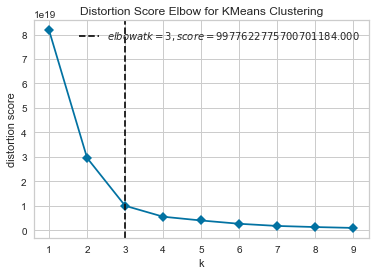

In [5]:
# PS: THIS TAKES A LOT OF TIME TO RUN DUE TO LARGE COMPUTATION (~20 minutes)

# finding the elbow value
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model,timings=False,k=(1,10))

# Fit the data to the visualizer
visualizer.fit(all_scenarios_data[['Dur','TotPkts','TotBytes']])        

# Finalize and render the figure

visualizer.show()

In [19]:
# PS: THIS TAKES A LOT OF TIME TO RUN DUE TO LARGE COMPUTATION

# preprocessing
label_encoder = LabelEncoder()

# label encoding Protocol and Dir
all_scenarios_data['Proto'] = label_encoder.fit_transform(all_scenarios_data['Proto']) 
all_scenarios_data['Dir'] = label_encoder.fit_transform(all_scenarios_data['Dir'])

discretizer = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='quantile')
all_data_discrete = discretizer.fit_transform(all_scenarios_data[['Dur','TotPkts','TotBytes']])

# converting the ndarray to dataframe
temp_all_df = pd.DataFrame(data=all_data_discrete, columns=['Dur','TotPkts','TotBytes'])

# migrating the discretized values to the training data set
all_scenarios_data['Dur'] = temp_all_df['Dur'].values
all_scenarios_data['TotPkts'] = temp_all_df['TotPkts'].values
all_scenarios_data['TotBytes'] = temp_all_df['TotBytes'].values

# training_data
# encoding the features and returning one code per netflow
from functools import reduce

all_proto_counts = len(all_scenarios_data.Proto.unique())
all_pkt_counts = len(all_scenarios_data.TotPkts.unique())
all_byte_counts = len(all_scenarios_data.TotBytes.unique())

all_attribute_mapping_counts = [all_proto_counts, all_pkt_counts, all_byte_counts]
all_attribute_mapping_columns = ['Proto','TotPkts','TotBytes']
all_space_size = reduce(lambda x,y: x*y, all_attribute_mapping_counts)

all_codes = np.zeros(len(all_scenarios_data))
all_scenarios_data['code'] = all_codes
all_scenarios_data = all_scenarios_data.reset_index()

for row in range(len(all_scenarios_data)):
    code = 0
    ss = all_space_size
    for i in range(len(all_attribute_mapping_columns)):
        code = code + all_scenarios_data.at[row, all_attribute_mapping_columns[i]] * (ss / all_attribute_mapping_counts[i])
        ss = (ss / all_attribute_mapping_counts[i])
    all_scenarios_data.at[row,'code'] = int(code)

all_scenarios_data

,index,StartTime,Dur,Proto,SrcAddr,Dir,DstAddr,TotPkts,TotBytes,code
0,0,2011-08-17 12:01:12.984851,2.0,14,93.45.141.223,0,147.32.84.118,2.0,1.0,133.0
1,1,2011-08-17 12:01:15.616709,2.0,14,84.16.60.37,0,147.32.84.118,2.0,1.0,133.0
2,2,2011-08-17 12:01:23.209772,2.0,14,94.44.197.227,0,147.32.84.118,2.0,1.0,133.0
3,3,2011-08-17 12:01:24.216680,2.0,14,94.44.197.227,0,147.32.84.118,2.0,1.0,133.0
4,4,2011-08-17 12:03:27.216922,2.0,14,147.32.3.51,0,147.32.87.22,2.0,1.0,133.0
...,...,...,...,...,...,...,...,...,...,...
3830016,325466,2011-08-19 11:45:43.615033,0.0,15,147.32.84.138,3,147.32.80.9,1.0,1.0,139.0
3830017,325467,2011-08-19 11:45:43.615086,0.0,15,147.32.84.138,3,147.32.80.9,1.0,1.0,139.0
3830018,325468,2011-08-19 11:45:43.619933,0.0,15,147.32.84.138,3,147.32.80.9,1.0,1.0,139.0
3830019,325469,2011-08-19 11:45:43.619941,0.0,15,147.32.84.138,3,147.32.80.9,1.0,1.0,139.0


In [20]:
all_scenarios_data['StartTime'] = pd.to_datetime(all_scenarios_data['StartTime'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

In [12]:
# function to return the discretised code value

def ret_host_states(data, width):
    start_times = data['StartTime']
    diff_list = []
    for i in range(len(data)):
        if i == 0:
            diff_time = 0
        else:
            diff_time = np.ceil((start_times.iloc[i] - start_times.iloc[i - 1]).value / (10**6))
        diff_list.append(diff_time)
    data['Time Diff'] = diff_list
    
    state_list = []
    for i in range(len(data)):
        j = i
        state_list.append([])
        temp_state_list = [data['code'].iloc[j]]
        dur = 0
        while True:
            try:
                dur += diff_list[j + 1]
            except:
                break
            j += 1
            if dur <= width:
                temp_state_list.append(data['code'].iloc[j])
            else:
                break
        if len(temp_state_list) >= 3:
            state_list[i] = temp_state_list
   
    data['States'] = state_list
    return data

In [13]:
#compute ngrams based on the states (code value)
def get_possible_ngrams(states, n):
    n_grams_final = []
    for i in range(len(states)):
        no_of_grams = len(states[i]) - n + 1
        for j in range(no_of_grams):
            n_grams_final.append(states[i][j:j + n])
    return n_grams_final

In [14]:
#sort n-grams
def sort_ngrams(ngrams):
    ngram_dict = {}
    for gram in ngrams:
        grams = str(gram)[1:-1]
        if grams in ngram_dict:
            ngram_dict[grams] += 1
        else:
            ngram_dict[grams] = 1
    sorted_grams = sorted(ngram_dict.items(), key=lambda x: x[1], reverse=True)
    # normalizing the sorted list of ngrams
    result_n_grams = [(list[0], 1.0 * list[1] / len(ngrams)) for list in sorted_grams ]
    return result_n_grams


In [15]:
# calculates the distance of a test host from infected host and normal host
def calculate_dist(l1, l2):
    l1 = np.array(l1)
    l2 = np.array(l2)
    dist = sum((np.divide((l1 - l2), (l1 + l2) / 2)) ** 2)
    return dist

In [16]:
# this function compares how much does test profile match with an infected host and normal host based on the previously calculated distance

def fingerprint_match(fp1, fp2, n_grams):
    fp1 = fp1[0:n_grams]
    freq1 = [pair[1] for pair in fp1]
    
    fp2 = {pair[0]: pair[1] for pair in fp2}
    freq2 = []
    
    for i in range(n_grams):
        key = fp1[i][0]
        if key in fp2:
            freq2.append(fp2[key])
        else:
            freq2.append(0)
    
    dist = calculate_dist(freq1, freq2)
    return dist

In [17]:
#creating profile for an infected host (147.32.84.208)
training_infected_hosts = all_scenarios_data[(all_scenarios_data['SrcAddr']=='147.32.84.208') | (all_scenarios_data['DstAddr']=='147.32.84.208')]
training_infected_states = ret_host_states(training_infected_hosts, width=90)
training_infected_states = [s for s in training_infected_states['States'] if len(s)>0]
training_infected_ngrams = get_possible_ngrams(training_infected_states,3)
training_infected_hosts = sort_ngrams(training_infected_ngrams)

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [18]:
#creating profile of a normal host (147.32.84.170)
training_normal_hosts = all_scenarios_data[(all_scenarios_data['SrcAddr']=='147.32.84.170') | (all_scenarios_data['DstAddr']=='147.32.84.170')]
training_normal_states = ret_host_states(training_normal_hosts, width=90)
training_normal_states = [s for s in training_normal_states['States'] if len(s)>0]
training_normal_ngrams = get_possible_ngrams(training_normal_states,3)
training_normal_hosts = sort_ngrams(training_normal_ngrams)

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [56]:
# PS: THIS TAKES A LOT OF TIME TO RUN DUE TO LARGE COMPUTATION (~10 minutes)

#function to convert label into 0 and 1 (botnet = 1, others = 0)
zero = 0
one = 0
def encode_label(dataset):
    for row in range(len(dataset)):
        
        if (re.search('Botnet', dataset.at[row, 'Label'])):
        
            dataset.at[row,'Label'] = 1
            
        else:
            dataset.at[row,'Label'] = 0

encode_label(scenario9)   

# prepare hosts_to_test list, considering all the hosts of scenario 9
hosts_to_test_dict = {}
for r in range(len(scenario9)):
    if scenario9.at[r,'SrcAddr'] not in hosts_to_test_dict.keys():
        hosts_to_test_dict[scenario9.at[r,'SrcAddr']] = scenario9.at[r,'Label']
    if scenario9.at[r,'DstAddr'] not in hosts_to_test_dict.keys():
        hosts_to_test_dict[scenario9.at[r,'DstAddr']] = scenario9.at[r,'Label']



In [46]:
#this code gets 50-50 test_labels each, due to class imbalance we had to do this way!

hosts_to_test = []
test_labels = []
for k in hosts_to_test_dict.keys():
    if hosts_to_test_dict[k] == 1 and one < 50:
        one+=1
        hosts_to_test.append(k)
        test_labels.append(hosts_to_test_dict[k])
    elif hosts_to_test_dict[k] == 0 and zero < 50:
        zero+=1
        hosts_to_test.append(k)
        test_labels.append(hosts_to_test_dict[k])

In [54]:
# PS: THIS TAKES A LOT OF TIME TO RUN DUE TO LARGE COMPUTATION (~10 minutes)

profile_match = np.zeros((len(hosts_to_test),2))

# find how much does the test host match with the training host and normal host

for index, host in enumerate(hosts_to_test):
    test_host = all_scenarios_data[(all_scenarios_data['SrcAddr'] == host) | (all_scenarios_data['DstAddr'] == host)]
    test_states = ret_host_states(test_host,width=90)
    test_states = [l for l in test_states['States'] if len(l)>0]
    test_ngrams = get_possible_ngrams(test_states, 3)
    fp = sort_ngrams(test_ngrams)
    profile_match[index][0] = fingerprint_match(training_infected_hosts, fp, 10)    
    profile_match[index][1] = fingerprint_match(training_normal_hosts, fp, 10)

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [53]:
# predicting labels for the test hosts to get the performance of the model

pred_labels = np.zeros(len(test_labels))

for i in range(len(pred_labels)):
        if profile_match[i][0] <= profile_match[i][1]:
            pred_labels[i] = 1
        else:
            pred_labels[i] = 0
pred_labels

# computing the confusion matrix
tn, fp, fn, tp = confusion_matrix(test_labels, pred_labels).ravel()


print("True Positives: %d\nFalse Positives: %d\nFalse Negatives: %d\nTrue Negatives: %d" % (tp, fp, fn, tn))


True Positives: 50
False Positives: 30
False Negatives: 0
True Negatives: 20


We performed the botnet profiling task on all scenarios based on n-gram model. We first combined all the scenarios data into 1 dataframe and found the discretised "code" values (as calculated in the task 1) for the entire dataset. We then defined a funtion to return a code value list (state list) of a host, in a given time frame based on the StartTime. Considering the state list, we perform functions to calculate the 3-grams and sort them. The next we define a function to calculate distance between any two given profiles. Then we present a profile matching function which compares the profiles (3-grams) of a test host with predefined normal and infected profiles and calculate the respective distance of a test host from these two profiles. Further we define training profiles of a normal host and an infected host (both belong to scenario 9). Then we prepare the test data list with all the hosts from scenario 9 and track their test labels to evaluate the performance (to keep the computation at minimum level we took 50-50 cases of both 0 and 1 label). At last we compare the test profiles with our two training profiles and represent its distance from both of them, and based on this distance, we judge whether a test host is infected or normal. The results show 50 true positives, 30 false positives and 20 true negatives with an accuracy of 62.5%.

### Botnet fingerprinting task

After fetching the profiles from the previous task using one infected host, we now make the n-grams for all the hosts and netflows (we only use scenario 11 keeping in mind the processing overhead for taking all the scenarios). 

In [21]:
# finding all ngrams for one infected host
infected_hosts = all_scenarios_data[(all_scenarios_data['SrcAddr']=='147.32.84.208') | (all_scenarios_data['DstAddr']=='147.32.84.208')]

infected_states = ret_host_states(infected_hosts, width=90)
infected_states = [s for s in infected_hosts['States'] if len(s)>0]

infected_grams = get_possible_ngrams(infected_states,3)
infected_grams

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[[133.0, 139.0, 134.0],
 [133.0, 138.0, 134.0],
 [138.0, 134.0, 139.0],
 [134.0, 139.0, 134.0],
 [139.0, 134.0, 138.0],
 [134.0, 138.0, 134.0],
 [138.0, 134.0, 138.0],
 [134.0, 138.0, 134.0],
 [138.0, 134.0, 139.0],
 [134.0, 139.0, 134.0],
 [139.0, 134.0, 138.0],
 [134.0, 138.0, 134.0],
 [138.0, 134.0, 139.0],
 [134.0, 139.0, 134.0],
 [139.0, 134.0, 138.0],
 [134.0, 138.0, 134.0],
 [138.0, 134.0, 139.0],
 [134.0, 139.0, 134.0],
 [139.0, 134.0, 139.0],
 [134.0, 139.0, 134.0],
 [139.0, 134.0, 134.0],
 [134.0, 134.0, 134.0],
 [134.0, 134.0, 134.0],
 [134.0, 134.0, 138.0],
 [134.0, 138.0, 134.0],
 [138.0, 134.0, 134.0],
 [134.0, 134.0, 132.0],
 [134.0, 132.0, 132.0],
 [132.0, 132.0, 132.0],
 [132.0, 132.0, 132.0],
 [132.0, 132.0, 132.0],
 [132.0, 132.0, 132.0],
 [132.0, 132.0, 132.0],
 [132.0, 132.0, 132.0],
 [132.0, 132.0, 132.0],
 [132.0, 132.0, 132.0],
 [138.0, 134.0, 139.0],
 [134.0, 139.0, 134.0],
 [134.0, 139.0, 134.0],
 [132.0, 132.0, 132.0],
 [132.0, 132.0, 132.0],
 [132.0, 132.0, 

In [34]:
# preprocessing
label_encoder = LabelEncoder()

# label encoding Protocol and Dir
hosts_scenario['Proto'] = label_encoder.fit_transform(hosts_scenario['Proto']) 
hosts_scenario['Dir'] = label_encoder.fit_transform(hosts_scenario['Dir'])

# #encoding Labels to 1s and 0s
def encode_label(dataset):
    for row in range(len(dataset)):
        if (re.search('Botnet', dataset.at[row, 'Label'])):
            dataset.at[row,'Label'] = 1
        else:
            dataset.at[row,'Label'] = 0

encode_label(hosts_scenario)

# From the elbow curve above, the elbow is approximately at k = 3 thus, using the same for the number of bins.
discretizer = KBinsDiscretizer(n_bins = 4 , encode='ordinal', strategy='quantile')
all_data_discrete = discretizer.fit_transform(hosts_scenario[['Dur','TotPkts','TotBytes']])

# converting the ndarray to dataframe
temp_all_df = pd.DataFrame(data=all_data_discrete, columns=['Dur','TotPkts','TotBytes'])

# migrating the discretized values to the training data set
hosts_scenario['Dur'] = temp_all_df['Dur'].values
hosts_scenario['TotPkts'] = temp_all_df['TotPkts'].values
hosts_scenario['TotBytes'] = temp_all_df['TotBytes'].values

# training_data
# encoding the features and returning one code per netflow
from functools import reduce

all_proto_counts = len(hosts_scenario.Proto.unique())
all_pkt_counts = len(hosts_scenario.TotPkts.unique())
all_byte_counts = len(hosts_scenario.TotBytes.unique())

all_attribute_mapping_counts = [all_proto_counts, all_pkt_counts, all_byte_counts]
all_attribute_mapping_columns = ['Proto','TotPkts','TotBytes']
all_space_size = reduce(lambda x,y: x*y, all_attribute_mapping_counts)

all_codes = np.zeros(len(hosts_scenario))
hosts_scenario['code'] = all_codes
hosts_scenario = hosts_scenario.reset_index()

for row in range(len(hosts_scenario)):
    code = 0
    ss = all_space_size
    for i in range(len(all_attribute_mapping_columns)):
        code = code + hosts_scenario.at[row, all_attribute_mapping_columns[i]] * (ss / all_attribute_mapping_counts[i])
        ss = (ss / all_attribute_mapping_counts[i])
    hosts_scenario.at[row,'code'] = int(code)

hosts_scenario

D:\Anaconda3\lib\site-packages\sklearn\preprocessing\_discretization.py:197: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 1 are removed. Consider decreasing the number of bins.
  'decreasing the number of bins.' % jj)


,index,StartTime,Dur,Proto,SrcAddr,Sport,Dir,DstAddr,Dport,State,sTos,dTos,TotPkts,TotBytes,SrcBytes,Label,code
0,0,2011/08/18 15:40:53.826372,3.0,10,76.76.172.248,63577,0,147.32.84.229,13363,SR_SA,0.0,0.0,1.0,0.0,122,0,124.0
1,1,2011/08/18 15:40:55.435494,3.0,10,76.76.172.248,63580,0,147.32.84.229,443,SR_SA,0.0,0.0,1.0,0.0,122,0,124.0
2,2,2011/08/18 15:40:57.060613,3.0,10,76.76.172.248,63582,0,147.32.84.229,80,SR_SA,0.0,0.0,1.0,0.0,122,0,124.0
3,3,2011/08/18 15:40:56.809619,3.0,10,76.76.172.248,63577,0,147.32.84.229,13363,SR_SA,0.0,0.0,1.0,0.0,122,0,124.0
4,4,2011/08/18 15:40:58.341523,3.0,10,76.76.172.248,63580,0,147.32.84.229,443,SR_SA,0.0,0.0,1.0,0.0,122,0,124.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107246,107246,2011/08/18 15:55:46.347093,1.0,11,147.32.85.25,57375,3,147.32.80.9,53,CON,0.0,0.0,1.0,1.0,66,0,137.0
107247,107247,2011/08/18 15:55:46.357022,0.0,11,147.32.84.59,63550,0,110.38.207.12,50613,INT,0.0,NaN,0.0,0.0,145,0,132.0
107248,107248,2011/08/18 15:55:46.357936,2.0,11,91.144.30.99,59481,3,147.32.84.229,13363,CON,0.0,0.0,1.0,2.0,462,0,138.0
107249,107249,2011/08/18 15:55:46.379560,0.0,11,147.32.85.25,57012,3,147.32.80.9,53,CON,0.0,0.0,1.0,1.0,79,0,137.0


In [35]:
hosts_scenario['StartTime'] = pd.to_datetime(hosts_scenario['StartTime'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

In [36]:
fp_all_hosts = ret_host_states(hosts_scenario, width=90)
gram_list = [s for s in fp_all_hosts['States'] if len(s)>0]
gram_list = get_possible_ngrams(gram_list, 3)

gram_index = 0
for rows in range(len(fp_all_hosts)):
    if len(fp_all_hosts.at[rows, 'States']) > 0:
        fp_all_hosts.at[rows, 'States'] = gram_list[gram_index]
        gram_index += 1

fp_all_hosts

,index,StartTime,Dur,Proto,SrcAddr,Sport,Dir,DstAddr,Dport,State,sTos,dTos,TotPkts,TotBytes,SrcBytes,Label,code,Time Diff,States
0,0,2011-08-18 15:40:53.826372,3.0,10,76.76.172.248,63577,0,147.32.84.229,13363,SR_SA,0.0,0.0,1.0,0.0,122,0,124.0,0.0,[]
1,1,2011-08-18 15:40:55.435494,3.0,10,76.76.172.248,63580,0,147.32.84.229,443,SR_SA,0.0,0.0,1.0,0.0,122,0,124.0,1610.0,[]
2,2,2011-08-18 15:40:57.060613,3.0,10,76.76.172.248,63582,0,147.32.84.229,80,SR_SA,0.0,0.0,1.0,0.0,122,0,124.0,1626.0,[]
3,3,2011-08-18 15:40:56.809619,3.0,10,76.76.172.248,63577,0,147.32.84.229,13363,SR_SA,0.0,0.0,1.0,0.0,122,0,124.0,-250.0,[]
4,4,2011-08-18 15:40:58.341523,3.0,10,76.76.172.248,63580,0,147.32.84.229,443,SR_SA,0.0,0.0,1.0,0.0,122,0,124.0,1532.0,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107246,107246,2011-08-18 15:55:46.347093,1.0,11,147.32.85.25,57375,3,147.32.80.9,53,CON,0.0,0.0,1.0,1.0,66,0,137.0,1.0,"[131.0, 131.0, 136.0]"
107247,107247,2011-08-18 15:55:46.357022,0.0,11,147.32.84.59,63550,0,110.38.207.12,50613,INT,0.0,NaN,0.0,0.0,145,0,132.0,10.0,"[131.0, 136.0, 138.0]"
107248,107248,2011-08-18 15:55:46.357936,2.0,11,91.144.30.99,59481,3,147.32.84.229,13363,CON,0.0,0.0,1.0,2.0,462,0,138.0,1.0,"[136.0, 138.0, 136.0]"
107249,107249,2011-08-18 15:55:46.379560,0.0,11,147.32.85.25,57012,3,147.32.80.9,53,CON,0.0,0.0,1.0,1.0,79,0,137.0,22.0,[]


Using the above ngrams for all the netflows in scenario 11, we check the occurence of an ngram from the infected profile and if one occurs we raise an alarm and predict it to be botnet traffic. Since we also keep the Label column in an encoded form (Botnet = 1, and 0 otherwise), we use this to compare our prediction simultaneosuly to record false positives and true positives, and true negatives. Since we have a huge class imbalance, it can be seen from the below results that we have a huge number of true negatives showing representing the benign netflows.

We see that fingerprinting is more effective than profiling. While fingerprinting gives 100% accuracy, Profiling manages only 60% accuracy, making fingerprinting more efficient with regards to eliminating false positives. 

In [44]:
false_positives = 0
true_positives = 0
true_negatives = 0
hosts_covered = []
for rows in range(len(fp_all_hosts)):
    temp_label = 0
    if len(fp_all_hosts.at[rows, 'States']) > 0: 
        if fp_all_hosts.at[rows, 'States'] in infected_grams:
            if fp_all_hosts.at[rows, 'SrcAddr'] not in hosts_covered or fp_all_hosts.at[rows, 'DstAddr'] not in hosts_covered:
                hosts_covered.append(fp_all_hosts.at[rows, 'SrcAddr'])
                hosts_covered.append(fp_all_hosts.at[rows, 'DstAddr'])
                if fp_all_hosts.at[rows, 'Label'] == 1:
                    true_positives +=1
                elif fp_all_hosts.at[rows, 'Label'] == 0:
                    true_negatives +=1
                else:
                    false_positives += 1
#         print('Alarm for SrcAddr : %s and DstAddr: %s' % (fp_all_hosts.at[rows,'SrcAddr'],fp_all_hosts.at[rows,'DstAddr']))

print("False Positives: %d\nTrue Positives: %d\nTrue Negatives: %d" %(false_positives, true_positives, true_negatives))

False Positives: 0
True Positives: 2
True Negatives: 1994
